In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'
od.download(dataset_url)

  0%|          | 0.00/2.29G [00:00<?, ?B/s]

100%|██████████| 2.29G/2.29G [01:03<00:00, 38.6MB/s]


The dataset has a single folder called `images` which contains all 63,000+ images in JPG format.

In [4]:
import os

DATA_DIR = './best-artworks-of-all-time/images'
print(os.listdir(DATA_DIR))

['images']


In [5]:
print(os.listdir(DATA_DIR+'/images')[:10])

['Peter_Paul_Rubens', 'Henri_Rousseau', 'Pierre-Auguste_Renoir', 'Eugene_Delacroix', 'Alfred_Sisley', 'Vincent_van_Gogh', 'Frida_Kahlo', 'Gustav_Klimt', 'William_Turner', 'Claude_Monet']


In [6]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [7]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [8]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [9]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [11]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


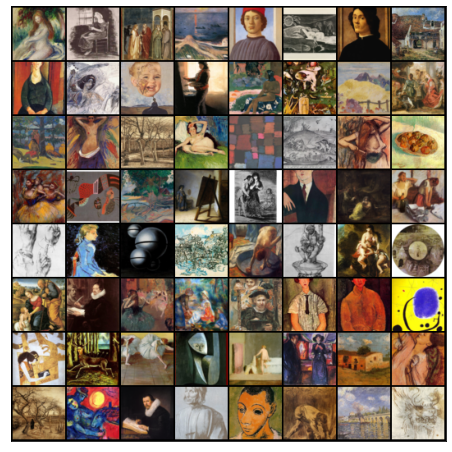

In [12]:
show_batch(train_dl)

In [13]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [14]:
device = get_default_device()
device

device(type='cuda')

In [15]:
train_dl = DeviceDataLoader(train_dl, device)

In [16]:
import torch.nn as nn

In [17]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [18]:
discriminator = to_device(discriminator, device)

In [19]:
latent_size = 128

In [20]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


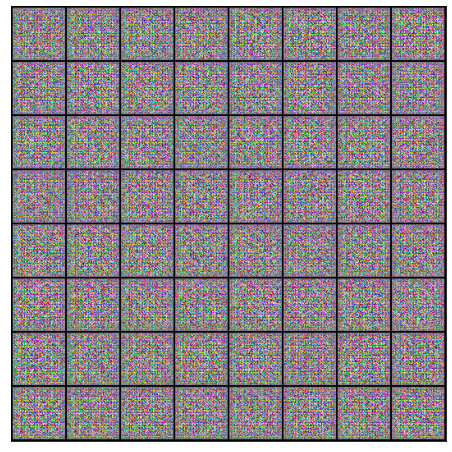

In [21]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [22]:
generator = to_device(generator, device)

In [23]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [24]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [25]:
from torchvision.utils import save_image

In [26]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [27]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [28]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


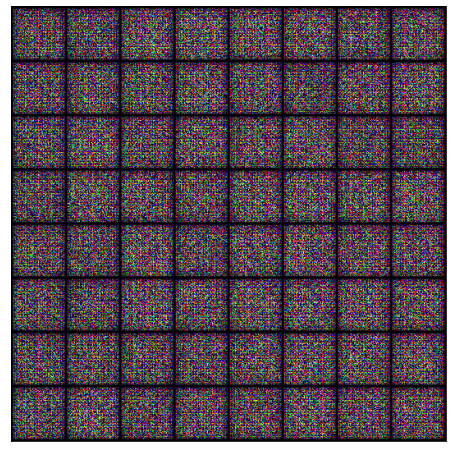

In [29]:
save_samples(0, fixed_latent)

In [31]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [32]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [33]:
lr = 0.0003
epochs = 70

In [34]:
history = fit(epochs, lr)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Epoch [1/70], loss_g: 4.0329, loss_d: 0.5836, real_score: 0.7249, fake_score: 0.2043
Saving generated-images-0001.png



Epoch [2/70], loss_g: 3.5082, loss_d: 0.5860, real_score: 0.8273, fake_score: 0.2772
Saving generated-images-0002.png



Epoch [3/70], loss_g: 3.7816, loss_d: 0.5222, real_score: 0.6968, fake_score: 0.0478
Saving generated-images-0003.png



Epoch [4/70], loss_g: 2.8695, loss_d: 0.7205, real_score: 0.8253, fake_score: 0.3806
Saving generated-images-0004.png



Epoch [5/70], loss_g: 0.9629, loss_d: 0.8671, real_score: 0.5571, fake_score: 0.1679
Saving generated-images-0005.png



Epoch [6/70], loss_g: 5.2553, loss_d: 1.2745, real_score: 0.8641, fake_score: 0.6093
Saving generated-images-0006.png



Epoch [7/70], loss_g: 2.2855, loss_d: 0.7569, real_score: 0.6857, fake_score: 0.2773
Saving generated-images-0007.png



Epoch [8/70], loss_g: 3.4882, loss_d: 0.4574, real_score: 0.8252, fake_score: 0.2152
Saving generated-images-0008.png



Epoch [9/70], loss_g: 2.3871, loss_d: 0.6322, real_score: 0.6121, fake_score: 0.0801
Saving generated-images-0009.png



Epoch [10/70], loss_g: 3.2516, loss_d: 0.2946, real_score: 0.8778, fake_score: 0.1366
Saving generated-images-0010.png



Epoch [11/70], loss_g: 2.2440, loss_d: 0.5327, real_score: 0.7270, fake_score: 0.1683
Saving generated-images-0011.png



Epoch [12/70], loss_g: 4.1580, loss_d: 0.5611, real_score: 0.8645, fake_score: 0.3095
Saving generated-images-0012.png



Epoch [13/70], loss_g: 3.3163, loss_d: 0.4035, real_score: 0.7542, fake_score: 0.0929
Saving generated-images-0013.png



Epoch [14/70], loss_g: 3.5854, loss_d: 0.5990, real_score: 0.7693, fake_score: 0.2567
Saving generated-images-0014.png



Epoch [15/70], loss_g: 4.2280, loss_d: 0.5569, real_score: 0.8833, fake_score: 0.3292
Saving generated-images-0015.png



Epoch [16/70], loss_g: 2.8422, loss_d: 0.5290, real_score: 0.7145, fake_score: 0.1207
Saving generated-images-0016.png



Epoch [17/70], loss_g: 4.5556, loss_d: 0.5804, real_score: 0.8889, fake_score: 0.3266
Saving generated-images-0017.png



Epoch [18/70], loss_g: 2.9320, loss_d: 0.6662, real_score: 0.7037, fake_score: 0.2151
Saving generated-images-0018.png



Epoch [19/70], loss_g: 3.9235, loss_d: 0.5445, real_score: 0.8369, fake_score: 0.2745
Saving generated-images-0019.png



Epoch [20/70], loss_g: 4.1054, loss_d: 0.9314, real_score: 0.7049, fake_score: 0.3938
Saving generated-images-0020.png



Epoch [21/70], loss_g: 2.2362, loss_d: 0.5997, real_score: 0.6830, fake_score: 0.1371
Saving generated-images-0021.png



Epoch [22/70], loss_g: 3.5614, loss_d: 0.3408, real_score: 0.8060, fake_score: 0.1005
Saving generated-images-0022.png



Epoch [23/70], loss_g: 3.9058, loss_d: 0.5506, real_score: 0.9003, fake_score: 0.3235
Saving generated-images-0023.png



Epoch [24/70], loss_g: 4.4850, loss_d: 1.0745, real_score: 0.7853, fake_score: 0.4951
Saving generated-images-0024.png



Epoch [25/70], loss_g: 3.1131, loss_d: 0.4588, real_score: 0.7235, fake_score: 0.0951
Saving generated-images-0025.png



Epoch [26/70], loss_g: 3.5148, loss_d: 0.6161, real_score: 0.7566, fake_score: 0.2521
Saving generated-images-0026.png



Epoch [27/70], loss_g: 2.2888, loss_d: 0.6479, real_score: 0.5856, fake_score: 0.0368
Saving generated-images-0027.png



Epoch [28/70], loss_g: 3.3873, loss_d: 0.5224, real_score: 0.8762, fake_score: 0.2926
Saving generated-images-0028.png



Epoch [29/70], loss_g: 3.8008, loss_d: 0.4600, real_score: 0.8197, fake_score: 0.2054
Saving generated-images-0029.png



Epoch [30/70], loss_g: 4.9650, loss_d: 0.4202, real_score: 0.9066, fake_score: 0.2477
Saving generated-images-0030.png



Epoch [31/70], loss_g: 6.1587, loss_d: 0.6893, real_score: 0.9602, fake_score: 0.4346
Saving generated-images-0031.png



Epoch [32/70], loss_g: 1.1380, loss_d: 1.1773, real_score: 0.3863, fake_score: 0.0098
Saving generated-images-0032.png



Epoch [33/70], loss_g: 2.9125, loss_d: 0.5807, real_score: 0.7231, fake_score: 0.1901
Saving generated-images-0033.png



Epoch [34/70], loss_g: 5.0445, loss_d: 0.8955, real_score: 0.9854, fake_score: 0.5129
Saving generated-images-0034.png



Epoch [35/70], loss_g: 3.7669, loss_d: 0.6488, real_score: 0.9156, fake_score: 0.3740
Saving generated-images-0035.png



Epoch [36/70], loss_g: 4.2655, loss_d: 0.6571, real_score: 0.8804, fake_score: 0.3687
Saving generated-images-0036.png



Epoch [37/70], loss_g: 2.6068, loss_d: 1.0421, real_score: 0.4330, fake_score: 0.0097
Saving generated-images-0037.png



Epoch [38/70], loss_g: 4.9087, loss_d: 0.6151, real_score: 0.9417, fake_score: 0.3676
Saving generated-images-0038.png



Epoch [39/70], loss_g: 3.4774, loss_d: 0.4793, real_score: 0.6597, fake_score: 0.0220
Saving generated-images-0039.png



Epoch [40/70], loss_g: 4.5709, loss_d: 0.4444, real_score: 0.6938, fake_score: 0.0243
Saving generated-images-0040.png



Epoch [41/70], loss_g: 2.5612, loss_d: 0.2503, real_score: 0.8525, fake_score: 0.0774
Saving generated-images-0041.png



Epoch [42/70], loss_g: 1.7870, loss_d: 0.6876, real_score: 0.5910, fake_score: 0.0959
Saving generated-images-0042.png



Epoch [43/70], loss_g: 1.4697, loss_d: 0.8749, real_score: 0.4977, fake_score: 0.0429
Saving generated-images-0043.png



Epoch [44/70], loss_g: 3.4487, loss_d: 0.3302, real_score: 0.8245, fake_score: 0.1063
Saving generated-images-0044.png



Epoch [45/70], loss_g: 3.8643, loss_d: 0.3736, real_score: 0.7674, fake_score: 0.0684
Saving generated-images-0045.png



Epoch [46/70], loss_g: 3.0781, loss_d: 0.5138, real_score: 0.7074, fake_score: 0.0741
Saving generated-images-0046.png



Epoch [47/70], loss_g: 5.6731, loss_d: 0.6772, real_score: 0.9824, fake_score: 0.4352
Saving generated-images-0047.png



Epoch [48/70], loss_g: 1.5389, loss_d: 0.9077, real_score: 0.4896, fake_score: 0.0308
Saving generated-images-0048.png



Epoch [49/70], loss_g: 2.4798, loss_d: 0.5781, real_score: 0.8721, fake_score: 0.3026
Saving generated-images-0049.png



Epoch [50/70], loss_g: 3.4191, loss_d: 0.2069, real_score: 0.9095, fake_score: 0.0966
Saving generated-images-0050.png



Epoch [51/70], loss_g: 4.1421, loss_d: 0.2753, real_score: 0.8478, fake_score: 0.0901
Saving generated-images-0051.png



Epoch [52/70], loss_g: 3.3179, loss_d: 0.2934, real_score: 0.8684, fake_score: 0.1196
Saving generated-images-0052.png



Epoch [53/70], loss_g: 4.6560, loss_d: 0.3173, real_score: 0.7971, fake_score: 0.0370
Saving generated-images-0053.png



Epoch [54/70], loss_g: 0.5985, loss_d: 0.6971, real_score: 0.5565, fake_score: 0.0330
Saving generated-images-0054.png



Epoch [55/70], loss_g: 2.3539, loss_d: 0.3596, real_score: 0.7578, fake_score: 0.0564
Saving generated-images-0055.png



Epoch [56/70], loss_g: 4.1693, loss_d: 0.2541, real_score: 0.9543, fake_score: 0.1717
Saving generated-images-0056.png



Epoch [57/70], loss_g: 4.1451, loss_d: 0.1992, real_score: 0.8812, fake_score: 0.0560
Saving generated-images-0057.png



Epoch [58/70], loss_g: 0.7381, loss_d: 0.6446, real_score: 0.6064, fake_score: 0.0552
Saving generated-images-0058.png



Epoch [59/70], loss_g: 1.5417, loss_d: 0.7844, real_score: 0.5108, fake_score: 0.0180
Saving generated-images-0059.png



Epoch [60/70], loss_g: 2.3663, loss_d: 0.2190, real_score: 0.9160, fake_score: 0.1123
Saving generated-images-0060.png



Epoch [61/70], loss_g: 4.4006, loss_d: 0.2674, real_score: 0.8875, fake_score: 0.1200
Saving generated-images-0061.png



Epoch [62/70], loss_g: 3.0531, loss_d: 0.1823, real_score: 0.9195, fake_score: 0.0811
Saving generated-images-0062.png



Epoch [63/70], loss_g: 2.3372, loss_d: 0.4992, real_score: 0.7450, fake_score: 0.1479
Saving generated-images-0063.png



Epoch [64/70], loss_g: 3.5313, loss_d: 0.2871, real_score: 0.8679, fake_score: 0.1109
Saving generated-images-0064.png



Epoch [65/70], loss_g: 1.8330, loss_d: 0.8111, real_score: 0.5053, fake_score: 0.0054
Saving generated-images-0065.png



Epoch [66/70], loss_g: 5.0374, loss_d: 0.1557, real_score: 0.8829, fake_score: 0.0189
Saving generated-images-0066.png



Epoch [67/70], loss_g: 3.8138, loss_d: 0.1876, real_score: 0.8430, fake_score: 0.0060
Saving generated-images-0067.png



Epoch [68/70], loss_g: 3.5774, loss_d: 0.6813, real_score: 0.5581, fake_score: 0.0055
Saving generated-images-0068.png



Epoch [69/70], loss_g: 6.8466, loss_d: 0.9911, real_score: 0.9942, fake_score: 0.5687
Saving generated-images-0069.png



Epoch [70/70], loss_g: 4.2446, loss_d: 0.1699, real_score: 0.9072, fake_score: 0.0633
Saving generated-images-0070.png


In [35]:
losses_g, losses_d, real_scores, fake_scores = history

In [36]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [37]:
from IPython.display import Image

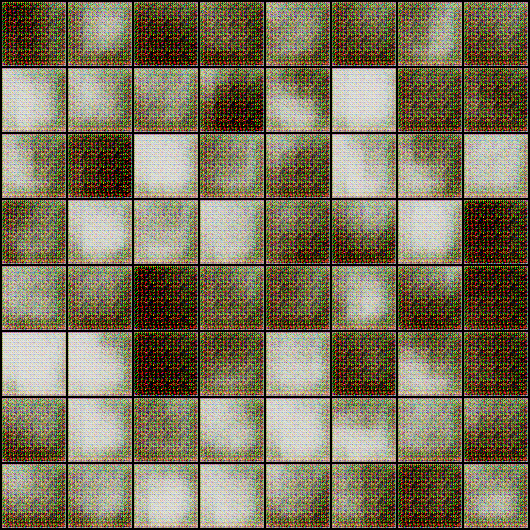

In [38]:
Image('./generated/generated-images-0001.png')

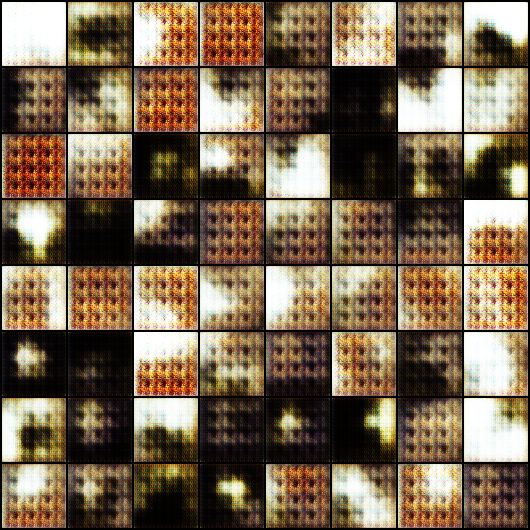

In [39]:
Image('./generated/generated-images-0005.png')

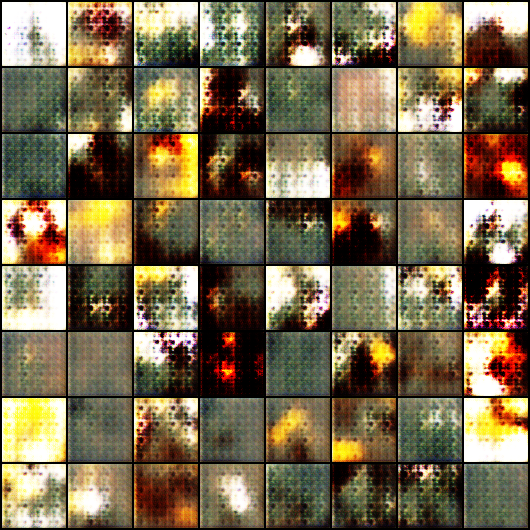

In [40]:
Image('./generated/generated-images-0010.png')

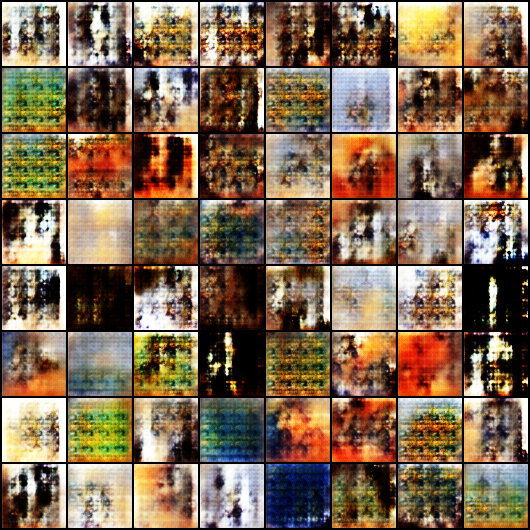

In [41]:
Image('./generated/generated-images-0020.png')

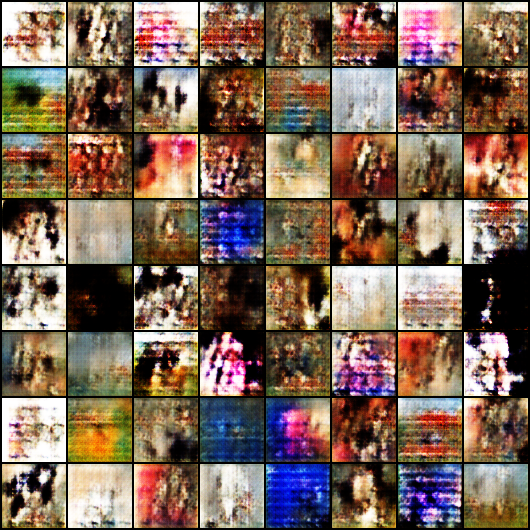

In [42]:
Image('./generated/generated-images-0025.png')

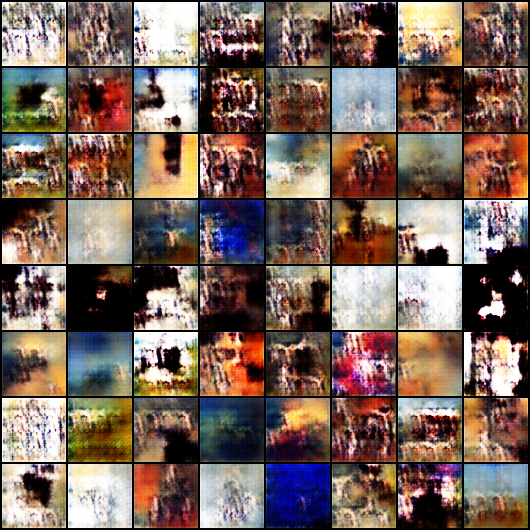

In [43]:
Image('./generated/generated-images-0030.png')

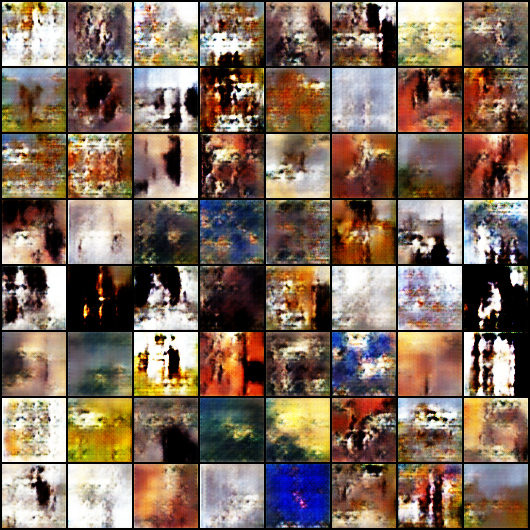

In [44]:
Image('./generated/generated-images-0035.png')

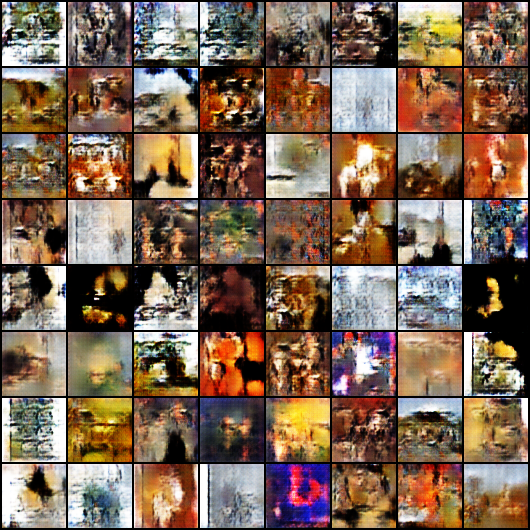

In [45]:
Image('./generated/generated-images-0040.png')

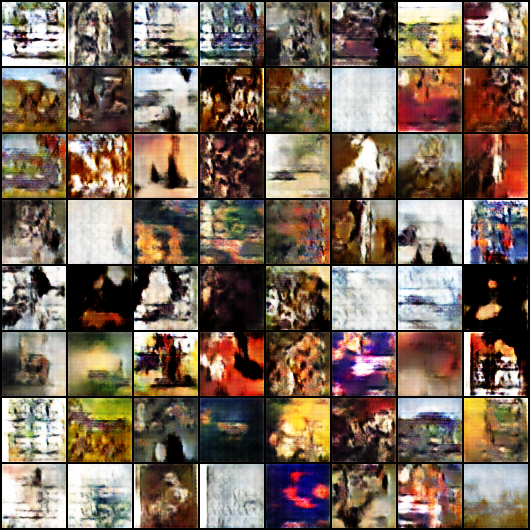

In [46]:
Image('./generated/generated-images-0045.png')

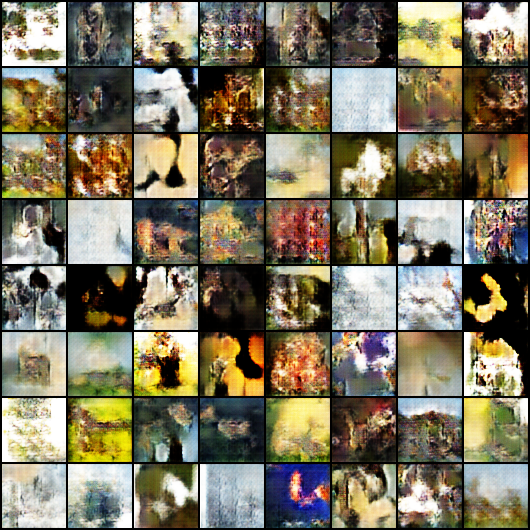

In [47]:
Image('./generated/generated-images-0050.png')

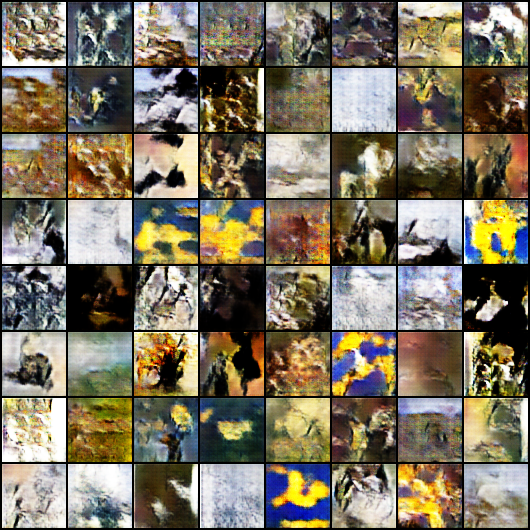

In [48]:
Image('./generated/generated-images-0055.png')

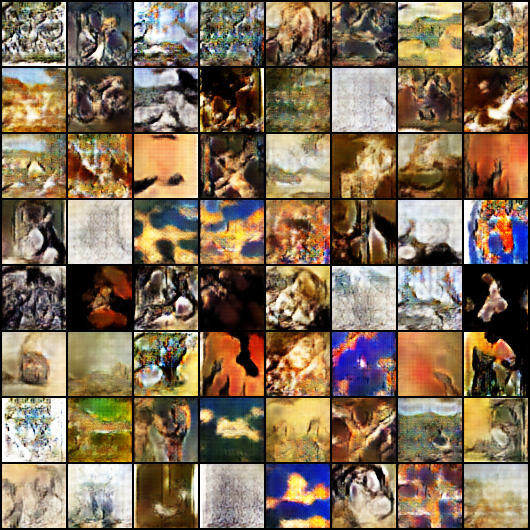

In [49]:
Image('./generated/generated-images-0060.png')

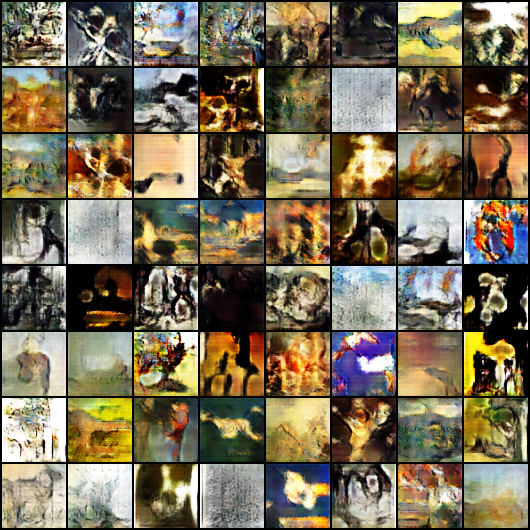

In [50]:
Image('./generated/generated-images-0065.png')

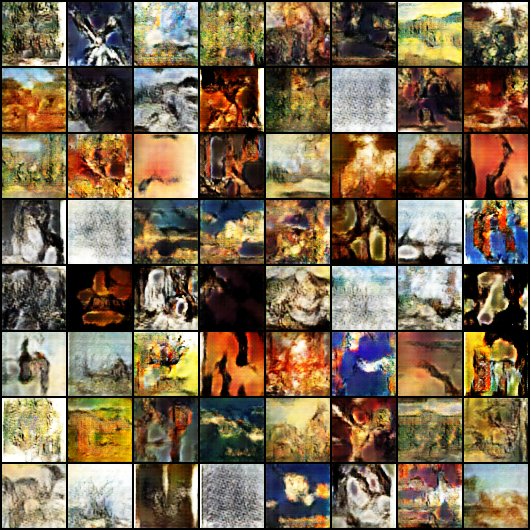

In [57]:
Image('./generated/generated-images-0068.png')

In [52]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

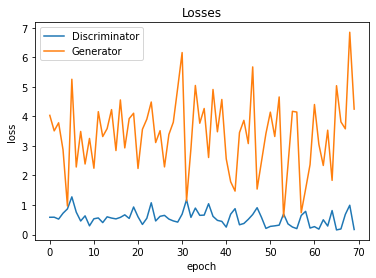

In [53]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

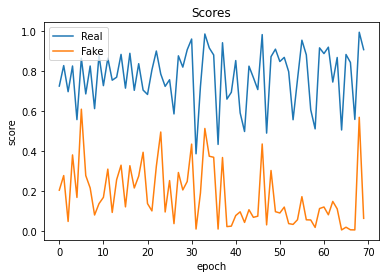

In [54]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');